In [68]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import os
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message="Geometry is in a geographic CRS.*")
warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)

# Load in the hybrid boundary and stats

In [69]:
shp_path = "/Users/michaelfoley/Google Drive/My Drive/Subnational_Yield_Database/boundaries/country/IND/2016_2023_hybrid_boundary_071925.shp" 
hybrid = gpd.read_file(shp_path)

In [70]:
ag_stats_path = "/Users/michaelfoley/Documents/Old_Documents/Climate/Crops/india_hybrid_methodology/data/temporally_harmonized_crop_data_071925.csv"
ag_stats = pd.read_csv(ag_stats_path)
ag_stats.columns

Index(['Data Source Organization', 'Data Source Document', 'Publication Name',
       'Survey Type', 'Country', 'Zone', 'FNID', 'Admin 1', 'Admin 2',
       'Admin 3', 'Year', 'Start Period', 'Season', 'End Period', 'Crop',
       'Dominant Production System', 'Area Planted: ha', 'Area Harvested: ha',
       'Yield: MT/ha', 'Quantity Produced: MT', 'Contributions by',
       'Source crop', 'DNL_Source_year', 'is_merged'],
      dtype='object')

# Merge them just based on names

In [71]:
ag_stats

,Data Source Organization,Data Source Document,Publication Name,Survey Type,Country,Zone,FNID,Admin 1,Admin 2,Admin 3,...,Crop,Dominant Production System,Area Planted: ha,Area Harvested: ha,Yield: MT/ha,Quantity Produced: MT,Contributions by,Source crop,DNL_Source_year,is_merged
0,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Madhya Pradesh,Chhindwara (MP),NaN,...,NaN,All (PS),NaN,18000.0,1.11,20000.0,Harvard,Small millets,2016-17,False
1,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Madhya Pradesh,Chhindwara (MP),NaN,...,NaN,All (PS),NaN,179000.0,3.23,578000.0,Harvard,Wheat,2016-17,False
2,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Madhya Pradesh,Chhindwara (MP),NaN,...,NaN,All (PS),NaN,260.0,10.00,2600.0,Harvard,Dry chillies,2016-17,False
3,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Madhya Pradesh,Chhindwara (MP),NaN,...,NaN,All (PS),NaN,3010.0,20.00,60200.0,Harvard,Ginger,2016-17,False
4,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Madhya Pradesh,Chhindwara (MP),NaN,...,NaN,All (PS),NaN,16000.0,2.00,32000.0,Harvard,Jowar,2016-17,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106977,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Bihar,Sheikhpura (BR),NaN,...,NaN,All (PS),NaN,20.0,74.75,1495.0,Harvard,Sugarcane,2022-23,False
106978,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Bihar,Sheikhpura (BR),NaN,...,NaN,All (PS),NaN,62.0,0.92,57.0,Harvard,Coriander,2022-23,False
106979,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Bihar,Sheikhpura (BR),NaN,...,NaN,All (PS),NaN,241.0,1.24,299.0,Harvard,Arhar/Tur,2022-23,False
106980,"MoA & FW, India","Official agricultural statistics, India, crop",https://data.desagri.gov.in/website/crops-apy-...,crop_final,IN,NaN,NaN,Bihar,Sheikhpura (BR),NaN,...,NaN,All (PS),NaN,442.0,0.56,247.0,Harvard,Moong(Green Gram),2022-23,False


In [72]:
hybrid

,id,boundary,name,wikidata,wikipedia,STATE,name_state,merged_dis,combined,group_numb,multidistr,change_yea,geometry
0,726993,administrative,Lahaul and Spiti,Q837595,en:Lahaul and Spiti district,HIMACHAL PRADESH,Lahaul and Spiti (HP),None,False,0.0,0.0,0.0,"POLYGON ((76.3713 32.80479, 76.3718 32.81253, ..."
1,728093,administrative,Kinnaur,Q1862950,en:Kinnaur district,HIMACHAL PRADESH,Kinnaur (HP),None,False,0.0,0.0,0.0,"POLYGON ((77.74825 31.71353, 77.75089 31.71643..."
2,728111,administrative,Kullu,Q2980880,en:Kullu district,HIMACHAL PRADESH,Kullu (HP),None,False,0.0,0.0,0.0,"POLYGON ((76.93577 32.09072, 76.9358 32.09486,..."
3,728141,administrative,Chamba,Q1060614,hi:चंबा जिला,HIMACHAL PRADESH,Chamba (HP),None,False,0.0,0.0,0.0,"POLYGON ((75.79671 32.88423, 75.79928 32.88556..."
4,728149,administrative,Kangra,Q727232,en:Kangra district,HIMACHAL PRADESH,Kangra (HP),None,False,0.0,0.0,0.0,"POLYGON ((75.59401 32.07734, 75.5954 32.08443,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
671,4055745,administrative,Tamenglong,Q2301717,en:Tamenglong district,MANIPUR,Tamenglong (MN),"Noney (MN), Tamenglong (MN)",True,75.0,0.0,2016.0,"POLYGON ((93.17167 24.52091, 93.17245 24.5226,..."
672,4055741,administrative,Churachandpur,Q2577281,en:Churachandpur district,MANIPUR,Churachandpur (MN),"Churachandpur (MN), Pherzawl (MN)",True,76.0,0.0,2016.0,"POLYGON ((93.3966 24.57814, 93.44967 24.54201,..."
673,4055941,administrative,Chandel,Q2301769,en:Chandel district,MANIPUR,Chandel (MN),"Chandel (MN), Tengnoupal (MN)",True,77.0,0.0,2016.0,"POLYGON ((93.74015 24.01521, 93.74113 24.01584..."
674,3885955,administrative,Bhiwani,Q1852857,en:Bhiwani district,HARYANA,Bhiwani (HR),"Bhiwani (HR), Charkhi Dadri (HR)",True,78.0,0.0,2016.0,"POLYGON ((76.33312 28.81269, 76.33367 28.81163..."


In [73]:
ag = ag_stats[['Admin 2', 'Year', 'Area Harvested: ha', 'Yield: MT/ha', 'Quantity Produced: MT', 'Source crop']]
ag.columns = ["name_state", "year", "area_harvested", "yield", "production", "ag_hy_crop"]

In [74]:
len(ag['name_state'].unique())

666

In [75]:
merged = ag.merge(hybrid, how='left')
merged = gpd.GeoDataFrame(merged, geometry='geometry')

In [76]:
merged

,name_state,year,area_harvested,yield,production,ag_hy_crop,id,boundary,name,wikidata,wikipedia,STATE,merged_dis,combined,group_numb,multidistr,change_yea,geometry
0,Chhindwara (MP),2016,18000.0,1.11,20000.0,Small millets,3965831.0,administrative,Chhindwara,Q1986096,en:Chhindwara district,MADHYA PRADESH,"Chhindwara (MP), Pandhurna (MP)",True,1.0,0.0,2023.0,"POLYGON ((78.34276 21.58905, 78.34279 21.58989..."
1,Chhindwara (MP),2016,179000.0,3.23,578000.0,Wheat,3965831.0,administrative,Chhindwara,Q1986096,en:Chhindwara district,MADHYA PRADESH,"Chhindwara (MP), Pandhurna (MP)",True,1.0,0.0,2023.0,"POLYGON ((78.34276 21.58905, 78.34279 21.58989..."
2,Chhindwara (MP),2016,260.0,10.00,2600.0,Dry chillies,3965831.0,administrative,Chhindwara,Q1986096,en:Chhindwara district,MADHYA PRADESH,"Chhindwara (MP), Pandhurna (MP)",True,1.0,0.0,2023.0,"POLYGON ((78.34276 21.58905, 78.34279 21.58989..."
3,Chhindwara (MP),2016,3010.0,20.00,60200.0,Ginger,3965831.0,administrative,Chhindwara,Q1986096,en:Chhindwara district,MADHYA PRADESH,"Chhindwara (MP), Pandhurna (MP)",True,1.0,0.0,2023.0,"POLYGON ((78.34276 21.58905, 78.34279 21.58989..."
4,Chhindwara (MP),2016,16000.0,2.00,32000.0,Jowar,3965831.0,administrative,Chhindwara,Q1986096,en:Chhindwara district,MADHYA PRADESH,"Chhindwara (MP), Pandhurna (MP)",True,1.0,0.0,2023.0,"POLYGON ((78.34276 21.58905, 78.34279 21.58989..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106977,Sheikhpura (BR),2022,20.0,74.75,1495.0,Sugarcane,3926355.0,administrative,Sheikhpura,Q100093,en:Sheikhpura district,BIHAR,None,False,0.0,0.0,0.0,"POLYGON ((85.60813 25.12465, 85.60918 25.12537..."
106978,Sheikhpura (BR),2022,62.0,0.92,57.0,Coriander,3926355.0,administrative,Sheikhpura,Q100093,en:Sheikhpura district,BIHAR,None,False,0.0,0.0,0.0,"POLYGON ((85.60813 25.12465, 85.60918 25.12537..."
106979,Sheikhpura (BR),2022,241.0,1.24,299.0,Arhar/Tur,3926355.0,administrative,Sheikhpura,Q100093,en:Sheikhpura district,BIHAR,None,False,0.0,0.0,0.0,"POLYGON ((85.60813 25.12465, 85.60918 25.12537..."
106980,Sheikhpura (BR),2022,442.0,0.56,247.0,Moong(Green Gram),3926355.0,administrative,Sheikhpura,Q100093,en:Sheikhpura district,BIHAR,None,False,0.0,0.0,0.0,"POLYGON ((85.60813 25.12465, 85.60918 25.12537..."


# Harmonization between Hybrid and Icrisat

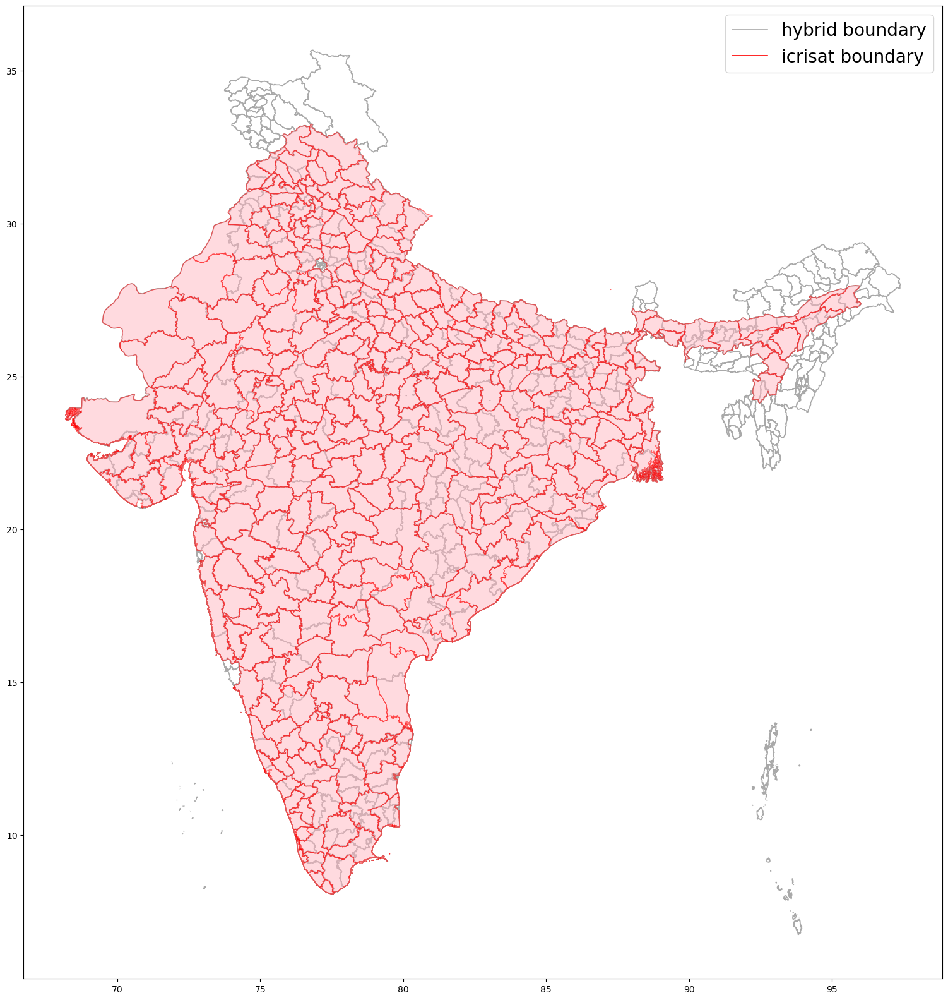

In [77]:
## visualizing the 2 shapefiles
hybrid = gpd.read_file(shp_path)
label1 = "hybrid boundary"

icri_path = "/Users/michaelfoley/Library/CloudStorage/GoogleDrive-mfoley@g.harvard.edu/My Drive/Subnational_Yield_Database/data/processed/IND/icrisat_apportioned/icrisat_boundary_match.shp"
icri = gpd.read_file(icri_path)
label2 = "icrisat boundary"

fig, ax = plt.subplots(figsize=(30, 20))
hybrid.plot(ax=ax, edgecolor='darkgray', facecolor='none', linewidth=1.2)
icri.plot(ax=ax, edgecolor='red', facecolor='lightpink', alpha=0.5)
leg1 = Line2D([0], [0], color='darkgray', linewidth=1.2, label= label1)
leg2 = Line2D([0], [0], color='red', linewidth=1.2, label= label2)
ax.legend(handles=[leg1, leg2], fontsize=20)
plt.show()

In [78]:
## match name columns and CRS 
if hybrid.crs != icri.crs:
    icri = icri.to_crs(hybrid.crs)

colname1 = "name"
colname2 = "Dist_Name"

hybrid['name'] = hybrid[colname1]
icri['name'] = icri[colname2]

In [79]:
## fx to find the overlaps in 2 shapefiles. make sure gdf1 (hybrid) is the bigger one!!


def compare_states(gdf_bigger, gdf2, gdf1_name, gdf2_name):
    similar_states = []

    # Go through each row in the first GeoDataFrame and compare with each row in the second GeoDataFrame
    for idx1, row1 in gdf_bigger.iterrows():
        for idx2, row2 in gdf2.iterrows():
            intersection = row1.geometry.intersection(row2.geometry)
            
            # Check if the intersection is not empty
            # and calculate the overlap ratio
            if not intersection.is_empty:
                area1 = row1.geometry.area
                area2 = row2.geometry.area
                intersection_area = intersection.area

                overlap1 = intersection_area / area1
                overlap2 = intersection_area / area2

                # Only consider pairs with significant overlap and record the overlap ratio
                if overlap1 > 0.05 and overlap2 > 0.05:
                    similar_states.append({
                        "name_" + gdf1_name: row1[colname1], 
                        "name_" + gdf2_name: row2[colname2], 
                        "name_state_" + gdf1_name : row1['name_state'],
                        "NAME_1_" + gdf2_name: row2['NAME_1'],
                        "overlap_" + gdf1_name: round(overlap1, 2),
                        "overlap_" + gdf2_name: round(overlap2, 2) })

    return pd.DataFrame(similar_states)

In [80]:
## run function
comparison = compare_states(hybrid, icri, "hybrid", "icri")

#588 similar states. overlap_hybrid should generally be larger than overlap_icri because hybrid is the larger shapefile
#with smaller districts.
comparison

,name_hybrid,name_icri,name_state_hybrid,NAME_1_icri,overlap_hybrid,overlap_icri
0,Lahaul and Spiti,Lahul & Spiti,Lahaul and Spiti (HP),Himachal Pradesh,0.97,0.97
1,Kinnaur,Kinnaur,Kinnaur (HP),Himachal Pradesh,0.97,0.96
2,Kullu,Kullu,Kullu (HP),Himachal Pradesh,0.97,0.97
3,Chamba,Chamba,Chamba (HP),Himachal Pradesh,0.97,0.97
4,Kangra,Kangra,Kangra (HP),Himachal Pradesh,0.97,0.67
...,...,...,...,...,...,...
583,Karimnagar,Karimnagar,Karimnagar (TG),Telangana,0.76,0.81
584,Karimnagar,Medak,Karimnagar (TG),Telangana,0.20,0.26
585,Adilabad,Adilabad,Adilabad (TG),Telangana,0.98,0.99
586,Bhiwani,Mahendragarh / Narnaul,Bhiwani (HR),Haryana,0.97,0.58


In [81]:
## lowest hanging fruit -- sort the states that are pretty much identical

identical_states = comparison[(comparison['overlap_hybrid']>=0.9) & (comparison['overlap_icri']>=0.9) ]
identical = icri[(icri['name'].isin(identical_states['name_icri'])) & (icri['NAME_1'].isin(identical_states['NAME_1_icri']))][['Dist_Name', 'NAME_1', 'Name_12', 'geometry']]

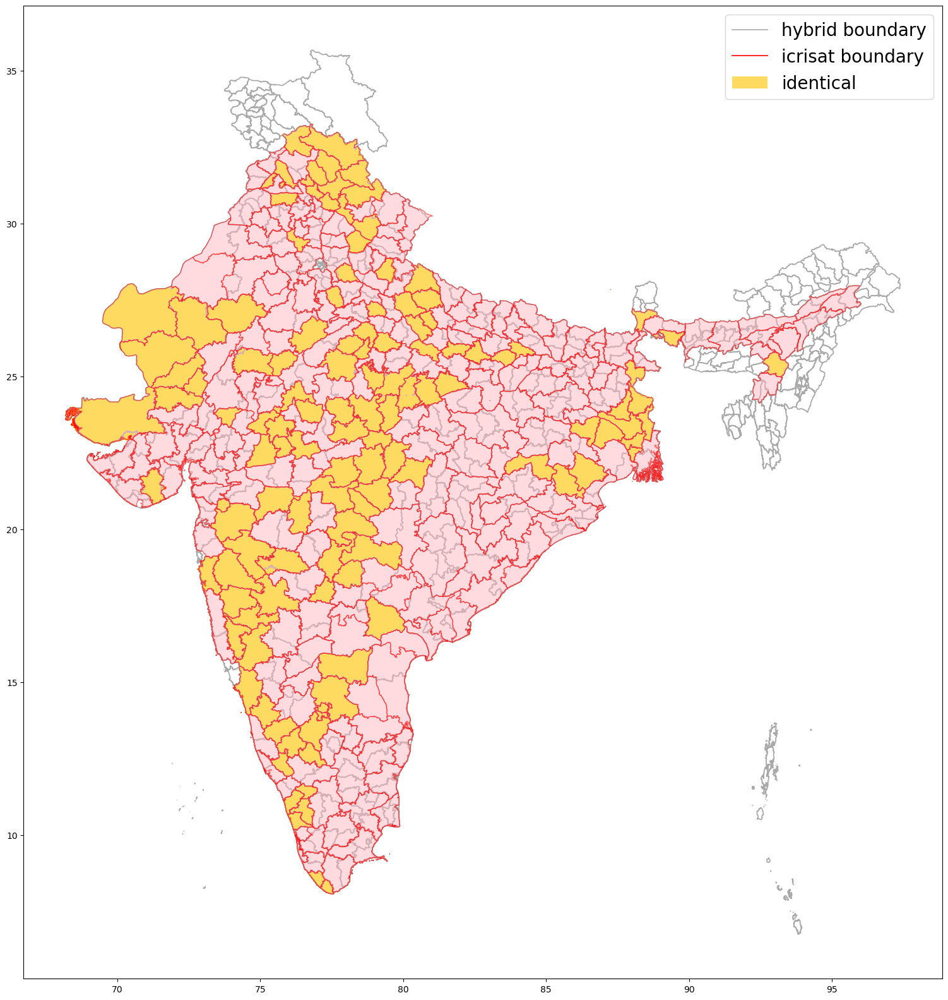

In [82]:
fig, ax = plt.subplots(figsize=(30, 20))

identical.plot(ax=ax, edgecolor='yellow', facecolor='yellow')
hybrid.plot(ax=ax, edgecolor='darkgray', facecolor='none', linewidth=1.2)
icri.plot(ax=ax, edgecolor='red', facecolor='lightpink', alpha=0.5)

leg1 = Line2D([0], [0], color='darkgray', linewidth=1.2, label= label1)
leg2 = Line2D([0], [0], color='red', linewidth=1.2, label= label2)
leg3 = mpatches.Patch(facecolor="#FFDA60", label="identical")
ax.legend(handles=[leg1, leg2, leg3], fontsize=20)

plt.show()

Most of the nearly identical shapes seem to match up almost perfectly, with only a few having deviations in boundaries.

## Find which hybrid districts are almost entirely nested within ICRISAT districts by looking at an overlap ratio of >0.9

In [83]:
nonidentical_states = comparison.merge(identical_states, how='left', indicator=True).query('_merge == "left_only"').drop(columns=['_merge'])
print(len(nonidentical_states) == len(comparison)- len(identical_states))

True


In [84]:
hybrid_nested_icri_states = nonidentical_states[nonidentical_states['overlap_hybrid']>=0.9]
nested1 = hybrid[(hybrid['name'].isin(hybrid_nested_icri_states['name_hybrid'])) & (hybrid['name_state'].isin(hybrid_nested_icri_states['name_state_hybrid']))][['name', 'STATE', 'name_state', 'geometry']]
len(nested1)

399

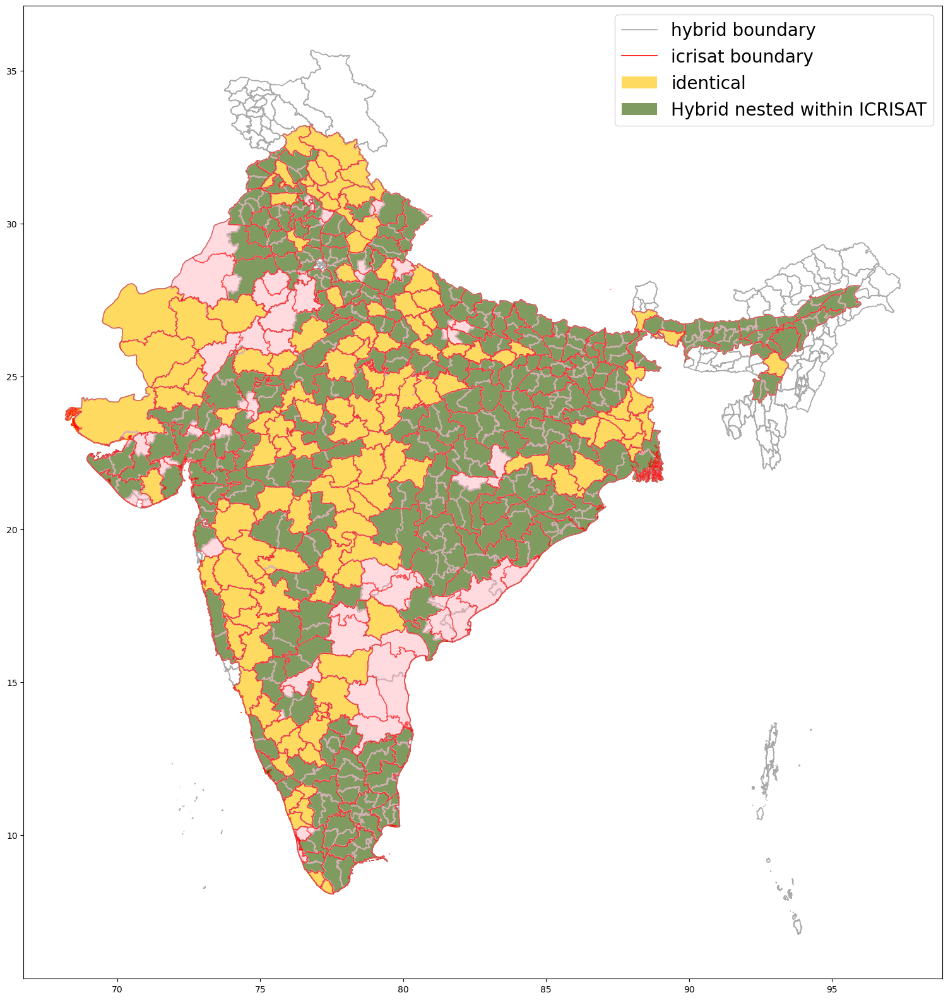

In [85]:
fig, ax = plt.subplots(figsize=(30, 20))

identical.plot(ax=ax, edgecolor='yellow', facecolor='yellow')
nested1.plot(ax=ax, edgecolor='green', facecolor='green')
hybrid.plot(ax=ax, edgecolor='darkgray', facecolor='none', linewidth=1.2)
icri.plot(ax=ax, edgecolor='red', facecolor='lightpink', alpha=0.5)

leg1 = Line2D([0], [0], color='darkgray', linewidth=1.2, label= label1)
leg2 = Line2D([0], [0], color='red', linewidth=1.2, label= label2)
leg3 = mpatches.Patch(facecolor="#FFDA60", label="identical")
leg4 = mpatches.Patch(facecolor="#7F9B60", label="Hybrid nested within ICRISAT")
ax.legend(handles=[leg1, leg2, leg3, leg4], fontsize=20)

plt.show()

In [86]:
icri_nested_hybrid_states= nonidentical_states[nonidentical_states['overlap_icri']>=0.9]
#nonidentical_states.merge(hybrid_nested_icri_states, how='left', indicator=True).query('_merge == "left_only"').drop(columns=['_merge'])
nested2 = icri[(icri['name'].isin(icri_nested_hybrid_states['name_icri'])) & (icri['NAME_1'].isin(icri_nested_hybrid_states['NAME_1_icri']))][['Dist_Name', 'NAME_1', 'Name_12', 'geometry']]

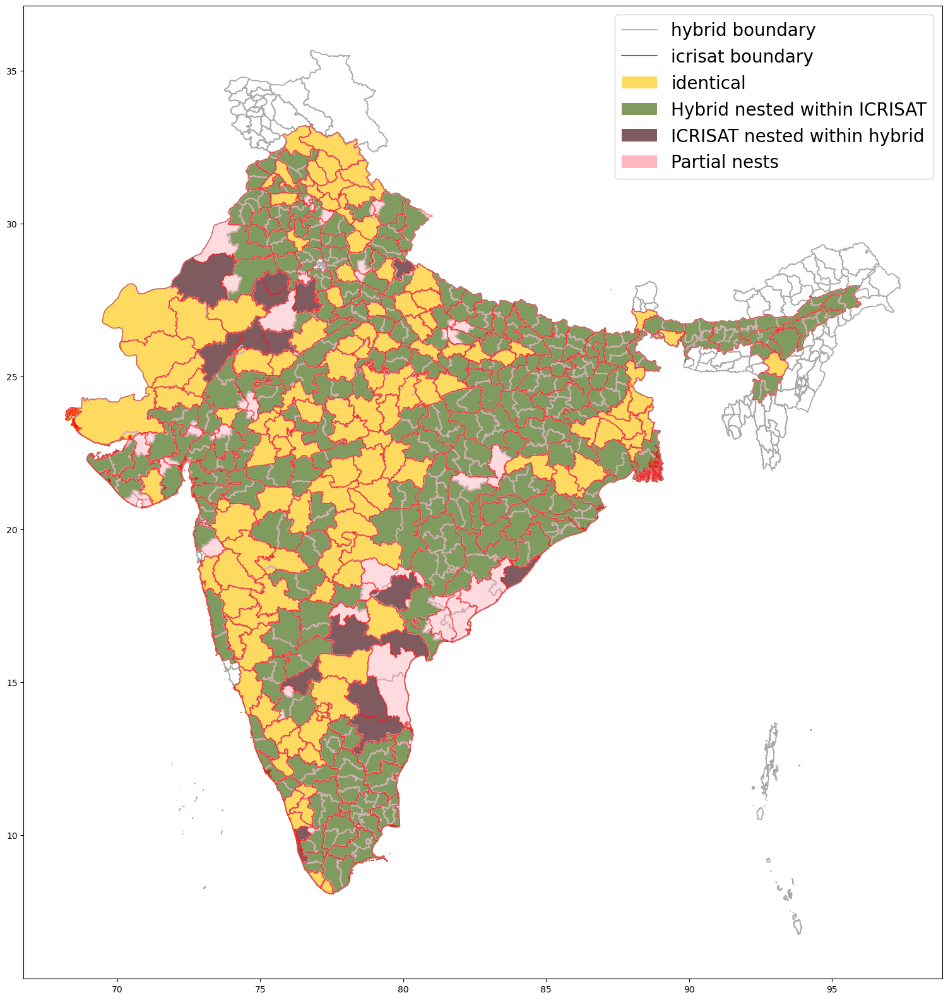

In [87]:
fig, ax = plt.subplots(figsize=(30, 20))

identical.plot(ax=ax, edgecolor='yellow', facecolor='yellow')
nested1.plot(ax=ax, edgecolor='green', facecolor='green')
nested2.plot(ax=ax, facecolor="black")
hybrid.plot(ax=ax, edgecolor='darkgray', facecolor='none', linewidth=1.2)
icri.plot(ax=ax, edgecolor='red', facecolor='lightpink', alpha=0.5)

leg1 = Line2D([0], [0], color='darkgray', linewidth=1.2, label= label1)
leg2 = Line2D([0], [0], color='red', linewidth=1.2, label= label2)
leg3 = mpatches.Patch(facecolor="#FFDA60", label="identical")
leg4 = mpatches.Patch(facecolor="#7F9B60", label="Hybrid nested within ICRISAT")
leg5 = mpatches.Patch(facecolor="#7F5B60", label="ICRISAT nested within hybrid")
leg6 = mpatches.Patch(facecolor="lightpink", label="Partial nests")
ax.legend(handles=[leg1, leg2, leg3, leg4, leg5, leg6], fontsize=20)

plt.savefig('../plots/icrisat_hybrid_boundaries.png')
plt.show()

## Merge data for identical districts with ICRISAT

In [88]:
## take whatever the hybrid yield data is and assign to ICRISAT

step1_3 = identical_states[['name_state_hybrid', 'NAME_1_icri', 'name_icri']]
step1_3.columns = ['name_state', 'NAME_1', 'Dist_Name']
step1_3 = step1_3.merge(identical, how="left")
step1_3['match'] = "identical"
step1_3['weight'] = 1
step1_3

,name_state,NAME_1,Dist_Name,Name_12,geometry,match,weight
0,Lahaul and Spiti (HP),Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,"POLYGON ((76.80276 33.23666, 76.8063 33.23623,...",identical,1
1,Kinnaur (HP),Himachal Pradesh,Kinnaur,Kinnaur,"POLYGON ((78.68611 32.05763, 78.68761 32.05336...",identical,1
2,Kullu (HP),Himachal Pradesh,Kullu,Kullu,"POLYGON ((77.20045 32.38543, 77.21265 32.37709...",identical,1
3,Chamba (HP),Himachal Pradesh,Chamba,Chamba,"POLYGON ((76.55589 33.20685, 76.56295 33.20618...",identical,1
4,Mandi (HP),Himachal Pradesh,Mandi,Mandi,"POLYGON ((76.7854 32.07604, 76.78794 32.06831,...",identical,1
...,...,...,...,...,...,...,...
117,Darjeeling (WB),West Bengal,Darjeeling,Darjeeling,"POLYGON ((88.12691 27.12308, 88.13663 27.11688...",identical,1
118,Bardhaman (WB),West Bengal,Burdwan,Burdwan,"POLYGON ((86.89501 23.87995, 86.90366 23.87897...",identical,1
119,Nizamabad (TG),Telangana,Nizamabad,Nizamabad,"POLYGON ((78.27684 18.94348, 78.28465 18.94079...",identical,1
120,Nalgonda (TG),Telangana,Nalgonda,Nalgonda,"POLYGON ((78.88192 17.8, 78.89333 17.79842, 78...",identical,1


In [89]:
## take whatever the hybrid yield data is and assign to ICRISAT

step2_3 = icri_nested_hybrid_states[['name_state_hybrid', 'NAME_1_icri', 'name_icri']]
step2_3.columns = ['name_state', 'NAME_1', 'Dist_Name']
step2_3 = step2_3.merge(nested2, how="left")
step2_3['match'] = "icri_nested_hybrid"
step2_3['weight']= 1
step2_3

,name_state,NAME_1,Dist_Name,Name_12,geometry,match,weight
0,Pilibhit (UP),Uttar Pradesh,Pilibhit,Pilibhit,"POLYGON ((79.74997 28.89335, 79.75977 28.88953...",icri_nested_hybrid,1
1,Ernakulam (KL),Kerala,Eranakulam,Eranakulam,"MULTIPOLYGON (((76.38292 9.82736, 76.38292 9.8...",icri_nested_hybrid,1
2,Alappuzha (KL),Kerala,Alappuzha,Alappuzha,"MULTIPOLYGON (((76.4043 9.54153, 76.4043 9.539...",icri_nested_hybrid,1
3,"Jaipur (RJ), Alwar (RJ)",Rajasthan,Alwar,Alwar,"POLYGON ((76.85434 28.22524, 76.85773 28.22317...",icri_nested_hybrid,1
4,"Ajmer (RJ), Pali (RJ), Tonk (RJ)",Rajasthan,Ajmer,Ajmer,"MULTIPOLYGON (((74.00774 25.86522, 74.04423 25...",icri_nested_hybrid,1
5,"Ajmer (RJ), Pali (RJ), Tonk (RJ)",Rajasthan,Pali,Pali,"POLYGON ((74.24109 26.45958, 74.24535 26.45859...",icri_nested_hybrid,1
6,"Ajmer (RJ), Pali (RJ), Tonk (RJ)",Rajasthan,Tonk,Tonk,"POLYGON ((75.28745 26.5654, 75.29131 26.56233,...",icri_nested_hybrid,1
7,"Sikar (RJ), Jhunjhunu (RJ)",Rajasthan,Jhunjhunu,Jhunjhunu,"POLYGON ((75.6711 28.51693, 75.69008 28.4991, ...",icri_nested_hybrid,1
8,"Sikar (RJ), Jhunjhunu (RJ)",Rajasthan,Sikar,Sikar,"POLYGON ((75.00533 28.19762, 75.00773 28.19524...",icri_nested_hybrid,1
9,"Sri Ganganagar (RJ), Bikaner (RJ)",Rajasthan,Bikaner,Bikaner,"POLYGON ((73.77796 29.04041, 73.77951 29.03913...",icri_nested_hybrid,1


## Need to spend some time understanding this - weight becomes overlap ratio though

In [90]:
## NOW HYBRIDS...

step3_3 = nonidentical_states[nonidentical_states['overlap_icri']<0.9]
####step3_3 =step3_3[-((step3_3['name_icri'].isin(step2_3['Name_12'])) & (step3_3['NAME_1_icri'].isin(step2_3['NAME_1'])))]

mix1 = hybrid[(hybrid['name'].isin(step3_3['name_hybrid'])) & (hybrid['name_state'].isin(step3_3['name_state_hybrid']))][['name', 'STATE', 'name_state', 'geometry']]
mix2 = icri[(icri['name'].isin(step3_3['name_icri'])) & (icri['NAME_1'].isin(step3_3['NAME_1_icri']))][['Dist_Name', 'NAME_1', 'Name_12', 'geometry']]

step3_3 = nonidentical_states[nonidentical_states['overlap_icri']<0.9][['name_state_hybrid', 'NAME_1_icri', 'name_icri', 'overlap_icri']]
step3_3.columns=['name_state', 'NAME_1', 'Dist_Name', 'weight']
step3_3 = step3_3.merge(mix2, how="left")
step3_3['match'] = "mixed"
step3_3

,name_state,NAME_1,Dist_Name,weight,Name_12,geometry,match
0,Kangra (HP),Himachal Pradesh,Kangra,0.67,Kangra,"POLYGON ((76.87897 32.44898, 76.87495 32.44093...",mixed
1,Una (HP),Himachal Pradesh,Kangra,0.18,Kangra,"POLYGON ((76.87897 32.44898, 76.87495 32.44093...",mixed
2,Hamirpur (HP),Himachal Pradesh,Kangra,0.12,Kangra,"POLYGON ((76.87897 32.44898, 76.87495 32.44093...",mixed
3,Chamoli (UK),Uttarakhand,Chamoli,0.83,Chamoli,"POLYGON ((79.40174 31.07989, 79.40624 31.07699...",mixed
4,Pithoragarh (UK),Uttarakhand,Pithorgarh,0.75,Pithorgarh,"POLYGON ((80.14784 30.81342, 80.15674 30.81254...",mixed
...,...,...,...,...,...,...,...
444,Warangal (TG),Telangana,Khammam,0.11,Khammam,"POLYGON ((80.48839 18.62672, 80.49812 18.61765...",mixed
445,Karimnagar (TG),Telangana,Karimnagar,0.81,Karimnagar,"POLYGON ((79.06396 19.03187, 79.07223 19.02201...",mixed
446,Karimnagar (TG),Telangana,Medak,0.26,Medak,"POLYGON ((77.70492 18.25868, 77.70924 18.2563,...",mixed
447,Bhiwani (HR),Haryana,Mahendragarh / Narnaul,0.58,Mahendragarh / Narnaul,"POLYGON ((76.00885 29.06304, 76.01419 29.06256...",mixed


In [91]:
comb = pd.concat([step1_3, step2_3, step3_3])
comb

,name_state,NAME_1,Dist_Name,Name_12,geometry,match,weight
0,Lahaul and Spiti (HP),Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,"POLYGON ((76.80276 33.23666, 76.8063 33.23623,...",identical,1.00
1,Kinnaur (HP),Himachal Pradesh,Kinnaur,Kinnaur,"POLYGON ((78.68611 32.05763, 78.68761 32.05336...",identical,1.00
2,Kullu (HP),Himachal Pradesh,Kullu,Kullu,"POLYGON ((77.20045 32.38543, 77.21265 32.37709...",identical,1.00
3,Chamba (HP),Himachal Pradesh,Chamba,Chamba,"POLYGON ((76.55589 33.20685, 76.56295 33.20618...",identical,1.00
4,Mandi (HP),Himachal Pradesh,Mandi,Mandi,"POLYGON ((76.7854 32.07604, 76.78794 32.06831,...",identical,1.00
...,...,...,...,...,...,...,...
444,Warangal (TG),Telangana,Khammam,Khammam,"POLYGON ((80.48839 18.62672, 80.49812 18.61765...",mixed,0.11
445,Karimnagar (TG),Telangana,Karimnagar,Karimnagar,"POLYGON ((79.06396 19.03187, 79.07223 19.02201...",mixed,0.81
446,Karimnagar (TG),Telangana,Medak,Medak,"POLYGON ((77.70492 18.25868, 77.70924 18.2563,...",mixed,0.26
447,Bhiwani (HR),Haryana,Mahendragarh / Narnaul,Mahendragarh / Narnaul,"POLYGON ((76.00885 29.06304, 76.01419 29.06256...",mixed,0.58


In [92]:
downscale = comb.merge(ag, how="left", on="name_state").drop(columns=['name_state', 'geometry'])
downscale

,NAME_1,Dist_Name,Name_12,match,weight,year,area_harvested,yield,production,ag_hy_crop
0,Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,identical,1.0,2016,437.0,0.89,391.0,Barley
1,Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,identical,1.0,2016,52.0,0.90,47.0,Wheat
2,Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,identical,1.0,2016,20.0,1.85,37.0,Maize
3,Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,identical,1.0,2016,1349.0,5.98,8072.0,Peas & beans (Pulses)
4,Himachal Pradesh,Lahul & Spiti,Lahul & Spiti,identical,1.0,2016,670.0,22.63,15161.0,Potato
...,...,...,...,...,...,...,...,...,...,...
102245,Haryana,Gurgaon,Gurgaon,mixed,0.3,2022,7370.0,0.53,3880.0,Jowar
102246,Haryana,Gurgaon,Gurgaon,mixed,0.3,2022,11590.0,2.15,24910.0,Rice
102247,Haryana,Gurgaon,Gurgaon,mixed,0.3,2022,1730.0,NaN,NaN,Cotton(lint)
102248,Haryana,Gurgaon,Gurgaon,mixed,0.3,2022,10.0,1.00,10.0,Moong(Green Gram)


## Compute new data by using weight of overlap ratio - confirm that all weights for each district add up to 1.

In [93]:
def weighted_mean(series, weights):
    return np.average(series, weights=weights) if not series.isna().all() else np.nan

final = downscale.groupby(['NAME_1', 'Name_12', 'Dist_Name', 'match', 'year', 'ag_hy_crop']).apply(
    lambda x: pd.Series({
        'area_harvested': weighted_mean(x['area_harvested'], x['weight']),
        'yield': weighted_mean(x['yield'], x['weight']),
        'production': weighted_mean(x['production'], x['weight'])
    })
).reset_index()


/var/folders/16/y9h7_0ld1418y9zts1sf_3xh0000gn/T/ipykernel_49015/2144005405.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final = downscale.groupby(['NAME_1', 'Name_12', 'Dist_Name', 'match', 'year', 'ag_hy_crop']).apply(


In [94]:
forplot = gpd.GeoDataFrame(final.merge(icri, how="left", on=['NAME_1', 'Name_12']))

<Axes: >

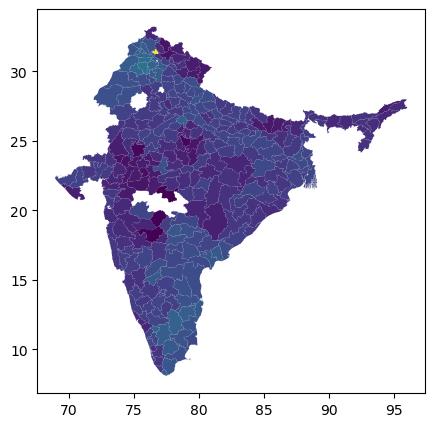

In [95]:
test= forplot[(forplot['year']==2020) & (forplot['ag_hy_crop']=="Rice")]
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
test.plot(ax=ax, column="yield")

In [96]:
os.system('say "done"')

0

In [97]:
final

,NAME_1,Name_12,Dist_Name,match,year,ag_hy_crop,area_harvested,yield,production
0,Andhra Pradesh,Ananthapur,Ananthapur,identical,2016,Arecanut,519.000000,4.270000,2218.000000
1,Andhra Pradesh,Ananthapur,Ananthapur,identical,2016,Arhar/Tur,35130.500000,0.050000,NaN
2,Andhra Pradesh,Ananthapur,Ananthapur,identical,2016,Bajra,1236.500000,0.505000,630.500000
3,Andhra Pradesh,Ananthapur,Ananthapur,identical,2016,Banana,8389.000000,68.000000,570418.000000
4,Andhra Pradesh,Ananthapur,Ananthapur,identical,2016,Cashewnut,19.000000,0.420000,8.000000
...,...,...,...,...,...,...,...,...,...
48934,West Bengal,West Dinajpur,West Dinajpur,mixed,2022,Rice,77979.305556,2.759444,232711.277778
48935,West Bengal,West Dinajpur,West Dinajpur,mixed,2022,Sesamum,321.588235,0.722353,224.470588
48936,West Bengal,West Dinajpur,West Dinajpur,mixed,2022,Sugarcane,367.416667,83.000000,30495.583333
48937,West Bengal,West Dinajpur,West Dinajpur,mixed,2022,Urad,1195.736842,0.766316,909.263158


### harmonizing to weight all averages

In [98]:
hybrid = gpd.read_file(shp_path)
ag = ag_stats[['Admin 2', 'Year', 'Area Harvested: ha', 'Yield: MT/ha', 'Quantity Produced: MT', 'Source crop', 'Season']]
ag.columns = ["name_state", "year", "area_harvested", "yield", "production", "ag_hy_crop", "season"]
ag.loc[ag['ag_hy_crop']=="Rapeseed &Mustard", 'ag_hy_crop'] = "Rapeseed and mustard"
ag.loc[ag['ag_hy_crop']=="Rapeseed/Mustardseed", 'ag_hy_crop'] = "Rapeseed and mustard"
ag.loc[ag['ag_hy_crop']=="Soybean", 'ag_hy_crop'] = "Soyabean"
ag['production'] = ag['production'] / 1000
ag['area_harvested']= ag['area_harvested']/1000

In [99]:
## cleaning for duplicates
ag = ag.applymap(lambda x: x.strip() if isinstance(x, str) else x)
ag['area_rd'] = ag['area_harvested'].round(2)
ag['prod_rd'] = ag['production'].round(2)
ag['yield_rd'] = ag['prod_rd']/ag['area_rd']
ag = ag.drop_duplicates(subset= ['name_state', 'year', 'area_rd', 'yield_rd', 'prod_rd', 'ag_hy_crop', 'season'])
dups = ag.duplicated(subset=['name_state', 'year', 'ag_hy_crop', 'season'], keep=False)
ag = ag[~(dups & ag[['area_harvested', 'yield', 'production']].isna().any(axis=1))]
dupes= ag.groupby(['name_state', 'year', 'ag_hy_crop', 'season']).count().reset_index()
dupes = dupes[dupes['yield']>1][['name_state', 'year', 'ag_hy_crop', 'season']]
dupes['duplicated'] = "TRUE"
ag = ag.merge(dupes, how="left")
ag.loc[ag['duplicated']!="TRUE", 'duplicated']= "FALSE"

/var/folders/16/y9h7_0ld1418y9zts1sf_3xh0000gn/T/ipykernel_49015/2432286489.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ag = ag.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [100]:
## cleaning for seasons
ag.loc[(ag['ag_hy_crop']=="Jowar") & (ag['season']=="Kharif"), 'ag_hy_crop'] = 'Kharif sorghum'
ag.loc[(ag['ag_hy_crop']=="Jowar") & (ag['season']=="Rabi"), 'ag_hy_crop'] = 'Rabi sorghum'
ag['seasons'] = ag.groupby(['name_state', 'year', 'ag_hy_crop'])['season'].transform('nunique')
ag = ag.drop(columns=['area_rd', 'prod_rd', 'yield_rd', 'season', 'yield'])
ag = ag.groupby(['name_state', 'year', 'ag_hy_crop', 'duplicated', 'seasons']).mean().reset_index()
ag['yield'] = ag['production']/ag['area_harvested'] ## I checked that this works! first did yield_calc and then compared the two yields

In [101]:
## cleaning for sorghum
s1 = ag[ag['ag_hy_crop']=="Kharif sorghum"]
s2 = ag[ag['ag_hy_crop']=="Rabi sorghum"]
s3 = ag[ag['ag_hy_crop']=="Jowar"]

sorg = pd.concat([s1,s2,s3]).drop(columns=['ag_hy_crop', 'yield'])
sorg = sorg.groupby(['name_state', 'year', 'duplicated']).agg({
    'production': 'mean',
    'area_harvested': 'mean',
    'seasons': 'sum'}).reset_index()

sorg['ag_hy_crop'] = "Sorghum"
ag = pd.concat([ag,sorg])

In [102]:
## match name columns and CRS 
if hybrid.crs != icri.crs:
    icri = icri.to_crs(hybrid.crs)

colname1 = "name"
colname2 = "Dist_Name"

hybrid['name'] = hybrid[colname1]
icri['name'] = icri[colname2]

## fx to find the overlaps in 2 shapefiles. make sure gdf1 is the bigger one!!

def compare_states(gdf_bigger, gdf2, gdf1_name, gdf2_name):
    similar_states = []

    for idx1, row1 in gdf_bigger.iterrows():
        for idx2, row2 in gdf2.iterrows():
            intersection = row1.geometry.intersection(row2.geometry)
            
            if not intersection.is_empty:
                area1 = row1.geometry.area
                area2 = row2.geometry.area
                intersection_area = intersection.area

                overlap1 = intersection_area / area1
                overlap2 = intersection_area / area2

                if overlap1 > 0.05 and overlap2 > 0.05:
                    similar_states.append({
                        "name_" + gdf1_name: row1[colname1], 
                        "name_" + gdf2_name: row2[colname2], 
                        "name_state_" + gdf1_name : row1['name_state'],
                        "NAME_1_" + gdf2_name: row2['NAME_1'],
                        "overlap_" + gdf1_name: round(overlap1, 2),
                        "overlap_" + gdf2_name: round(overlap2, 2) })

    return pd.DataFrame(similar_states)

## run function

comparison = compare_states(hybrid, icri, "hybrid", "icri")
comparison

,name_hybrid,name_icri,name_state_hybrid,NAME_1_icri,overlap_hybrid,overlap_icri
0,Lahaul and Spiti,Lahul & Spiti,Lahaul and Spiti (HP),Himachal Pradesh,0.97,0.97
1,Kinnaur,Kinnaur,Kinnaur (HP),Himachal Pradesh,0.97,0.96
2,Kullu,Kullu,Kullu (HP),Himachal Pradesh,0.97,0.97
3,Chamba,Chamba,Chamba (HP),Himachal Pradesh,0.97,0.97
4,Kangra,Kangra,Kangra (HP),Himachal Pradesh,0.97,0.67
...,...,...,...,...,...,...
583,Karimnagar,Karimnagar,Karimnagar (TG),Telangana,0.76,0.81
584,Karimnagar,Medak,Karimnagar (TG),Telangana,0.20,0.26
585,Adilabad,Adilabad,Adilabad (TG),Telangana,0.98,0.99
586,Bhiwani,Mahendragarh / Narnaul,Bhiwani (HR),Haryana,0.97,0.58


In [103]:
comp =  comparison[['name_state_hybrid', 'NAME_1_icri', 'name_icri', 'overlap_icri']]
tomerge = icri[(icri['name'].isin(comp['name_icri'])) & (icri['NAME_1'].isin(comp['NAME_1_icri']))][['Dist_Name', 'NAME_1', 'Name_12', 'geometry']]
comp.columns=['name_state', 'NAME_1', 'Dist_Name', 'weight']
comp = comp.merge(tomerge, how="left")

In [104]:
downscale = comp.merge(ag, how="left", on="name_state").drop(columns=['name_state', 'geometry'])
downscale

,NAME_1,Dist_Name,weight,Name_12,year,ag_hy_crop,duplicated,seasons,area_harvested,production,yield
0,Himachal Pradesh,Lahul & Spiti,0.97,Lahul & Spiti,2016,Barley,FALSE,1,0.437,0.391,0.894737
1,Himachal Pradesh,Lahul & Spiti,0.97,Lahul & Spiti,2016,Maize,FALSE,1,0.020,0.037,1.850000
2,Himachal Pradesh,Lahul & Spiti,0.97,Lahul & Spiti,2016,Peas & beans (Pulses),FALSE,1,1.349,8.072,5.983692
3,Himachal Pradesh,Lahul & Spiti,0.97,Lahul & Spiti,2016,Potato,FALSE,1,0.670,15.161,22.628358
4,Himachal Pradesh,Lahul & Spiti,0.97,Lahul & Spiti,2016,Rapeseed and mustard,FALSE,1,0.051,0.083,1.627451
...,...,...,...,...,...,...,...,...,...,...,...
87840,Haryana,Gurgaon,0.30,Gurgaon,2018,Sorghum,FALSE,1,8.500,4.500,NaN
87841,Haryana,Gurgaon,0.30,Gurgaon,2019,Sorghum,FALSE,1,11.730,6.180,NaN
87842,Haryana,Gurgaon,0.30,Gurgaon,2020,Sorghum,FALSE,1,8.680,4.560,NaN
87843,Haryana,Gurgaon,0.30,Gurgaon,2021,Sorghum,FALSE,1,7.388,3.890,NaN


In [105]:
def weighted_mean(series, weights):
    normalized_weights = weights / weights.sum() if weights.sum() != 0 else np.nan  # Normalize weights
    return np.average(series, weights=normalized_weights) if not series.isna().all() else np.nan

def unique_match(strings):
    unique_values = sorted(strings.dropna().astype(str).unique())
    return ', '.join(unique_values) if len(unique_values) > 1 else unique_values[0] if len(unique_values) == 1 else None

final = downscale.groupby(['NAME_1', 'Name_12', 'Dist_Name', 'year', 'ag_hy_crop']).apply(
    lambda x: pd.Series({
        'area_harvested': weighted_mean(x['area_harvested'], x['weight']),
        'yield_fake': weighted_mean(x['yield'], x['weight']),
        'production': weighted_mean(x['production'], x['weight']),
        'n_hybrid': x['weight'].count(),
        'seasons': weighted_mean(x['seasons'], x['weight']),
        'duplicated': unique_match(x['duplicated']) 
    })).reset_index()

/var/folders/16/y9h7_0ld1418y9zts1sf_3xh0000gn/T/ipykernel_49015/3180260992.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final = downscale.groupby(['NAME_1', 'Name_12', 'Dist_Name', 'year', 'ag_hy_crop']).apply(


In [106]:
final['yield'] = np.where(final['area_harvested'] != 0, final['production'] / final['area_harvested'], np.nan)
final.loc[final['duplicated']=="FALSE, TRUE", "duplicated"] = "TRUE"

<Axes: >

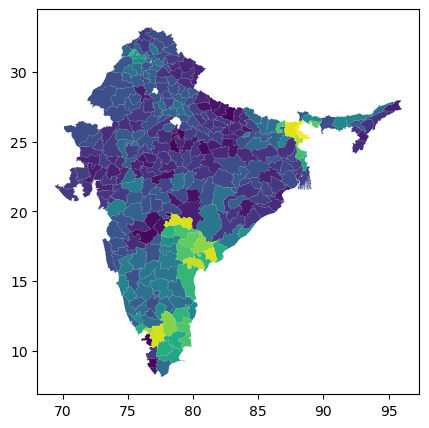

In [107]:
forplot = gpd.GeoDataFrame(final.merge(icri, how="left", on=['NAME_1', 'Name_12']))
test= forplot[(forplot['year']==2020) & (forplot['ag_hy_crop']=="Maize")]
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
test.plot(ax=ax, column="yield_fake")

<Axes: >

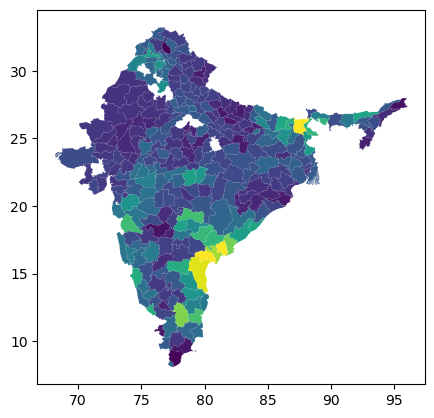

In [108]:
forplot = gpd.GeoDataFrame(final.merge(icri, how="left", on=['NAME_1', 'Name_12']))
test= forplot[(forplot['year']==2016) & (forplot['ag_hy_crop']=="Maize")]
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
test.plot(ax=ax, column="yield")

In [64]:
final.to_csv("../data/ag2016_2022_icrisat_harmonized.csv")

In [170]:
os.system('say "done"')

0

### plotting ag data

<Axes: >

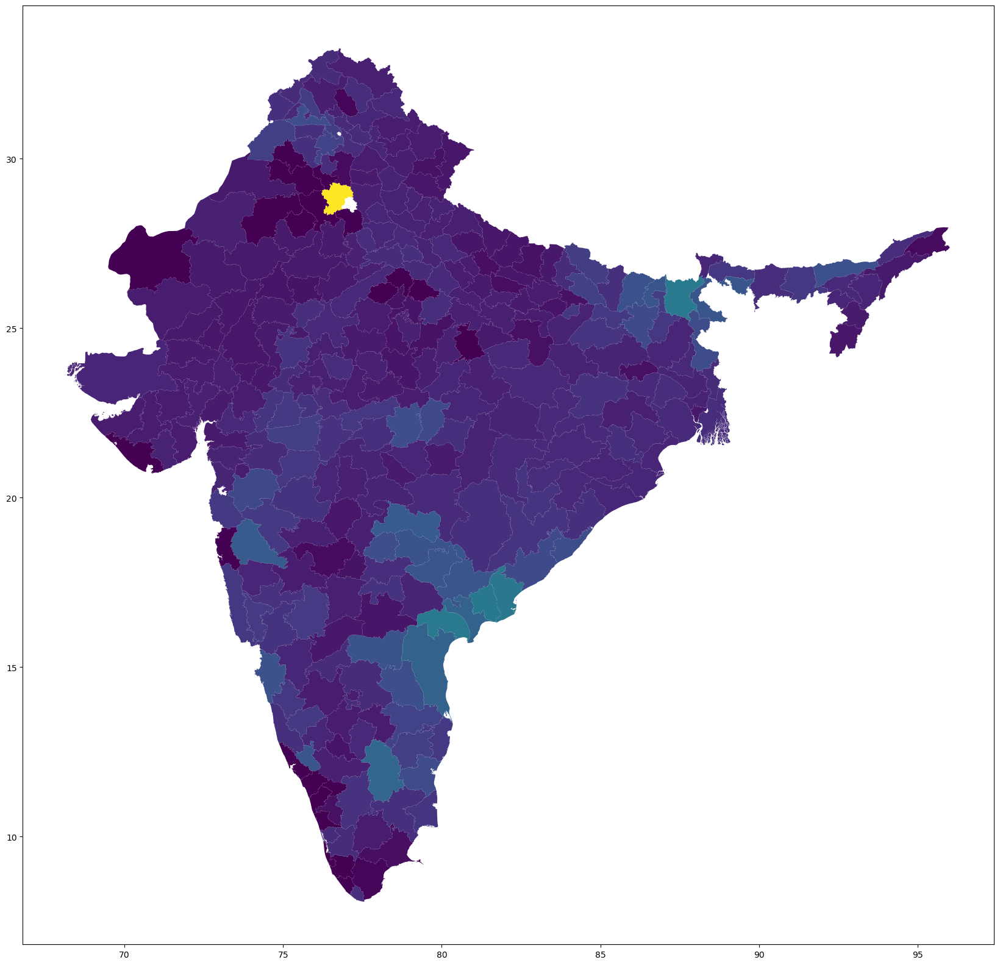

In [66]:
icri_apportioned_path = '/Users/michaelfoley/Library/CloudStorage/GoogleDrive-mfoley@g.harvard.edu/My Drive/Subnational_Yield_Database/data/processed/IND/icrisat_apportioned/ICRISAT-District Level Data_Apportioned.csv'
df = pd.read_csv(icri_apportioned_path)
icri = icri.rename(columns={'Name_12': 'Dist Name', 'NAME_1' : 'State Name'})
icri.loc[icri['State Name']== "Uttaranchal", "State Name"] = "Uttar Pradesh"
forplot = gpd.GeoDataFrame(icri.merge(df, how="left", on=['Dist Name', 'State Name']))

fig, ax = plt.subplots(figsize=(30, 20))
forplot[forplot['Year']==2016].plot(ax=ax, column="MAIZE YIELD (Kg per ha)")

### district names

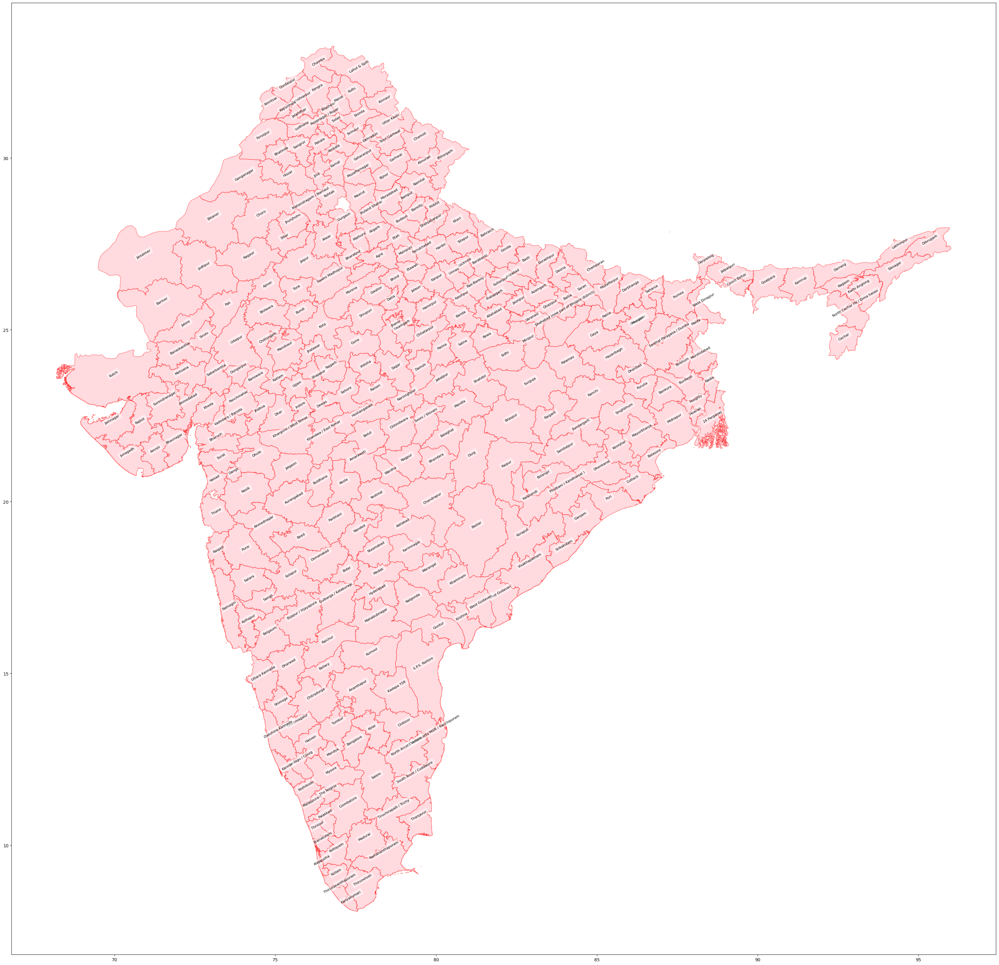

In [172]:
# shp_path = "./IND/icrisat_apportioned/icrisat_boundary_match.shp"
# icri = gpd.read_file(shp_path)
# icri["centroid"] = icri.geometry.centroid 


fig, ax = plt.subplots(figsize=(60, 40))
icri.plot(ax=ax, edgecolor='red', facecolor='lightpink', alpha=0.5)

for idx, row in icri.iterrows():
    centroid = row.geometry.centroid
    ax.text(centroid.x, centroid.y, row["Dist_Name"], 
            fontsize=8, ha="center", rotation=30, 
            color="black", bbox=dict(facecolor="white", alpha=0.5, edgecolor="none"))

plt.show()
